### Programming UMAP from Scratch

In [1]:
!pip install umap-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.3 MB/s eta 0:00:00


In [2]:
import numpy as np
import pandas as pd
from scipy import optimize
import matplotlib.pyplot as plt
from sklearn.manifold import SpectralEmbedding
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.metrics import pairwise as metrics
import os
from PIL import Image
import imageio

In [3]:
expr = pd.read_csv('bartoschek_filtered_expr_rpkm.txt', sep='\t')
print(expr.iloc[0:4,0:4])

                1110020A21Rik  1110046J04Rik  1190002F15Rik  1500015A07Rik
SS2_15_0048_A3            0.0            0.0            0.0            0.0
SS2_15_0048_A6            0.0            0.0            0.0            0.0
SS2_15_0048_A5            0.0            0.0            0.0            0.0
SS2_15_0048_A4            0.0            0.0            0.0            0.0


In [4]:
X_train = expr.values[:,0:(expr.shape[1]-1)]
X_train = np.log(X_train + 1)
y_train = expr.values[:,expr.shape[1]-1]
n = X_train.shape[0]

print("\nThis data set contains " + str(n) + " samples")


This data set contains 716 samples


Compute the pairwise Euclidean distances between samples in dataset and then find a specific value related to these distances for each sample `rho`.

In [5]:
# computes the pairwise Euclidean distances between all samples in X_train.
dist = np.square(euclidean_distances(X_train, X_train))

#For each sample, sort its distances to all other samples. and then taking the second-smallest distance
rho = [sorted(dist[i])[1] for i in range(dist.shape[0])]

In [6]:
def compute_high_dimensional_probability(sigma, distance_row):
    """
    Calculate the probability distribution for a given row of the Euclidean distance matrix.
    This function returns how close a sample is to the other samples based on the provided sigma.
    """
    adjusted_distances = dist[distance_row] - rho[distance_row]
    adjusted_distances[adjusted_distances < 0] = 0
    return np.exp(-adjusted_distances / sigma)

def calculate_k(probabilities):
    """
    Calculate the number of neighbors (k) based on the high-dimensional probability distribution.
    This function returns the sum of the distribution raised to the power of 2.
    """
    return np.power(2, np.sum(probabilities))

def binary_search_sigma(k_function, target_k):
    """
    Use binary search to find the sigma value that satisfies the equation k_function(sigma) = target_k.
    This function optimizes the sigma value for a given distance array and desired number of neighbors.
    """
    lower_bound = 0
    upper_bound = 1000
    for _ in range(20):
        mid_sigma = (lower_bound + upper_bound) / 2
        if k_function(mid_sigma) < target_k:
            lower_bound = mid_sigma
        else:
            upper_bound = mid_sigma
        if np.abs(target_k - k_function(mid_sigma)) <= 1e-5:
            break
    return mid_sigma

# Constants
N_NEIGHBORS = 15
probabilities = np.zeros((n, n))
sigma_values = []

# Main loop to compute probabilities and sigma values
for row in range(n):
    k_function = lambda sigma: calculate_k(compute_high_dimensional_probability(sigma, row))
    optimal_sigma = binary_search_sigma(k_function, N_NEIGHBORS)

    # Update the probability distribution with the new sigma
    probabilities[row] = compute_high_dimensional_probability(optimal_sigma, row)
    sigma_values.append(optimal_sigma)

    if (row + 1) % 100 == 0:
        print(f"Completed sigma binary search for {row + 1} out of {n} rows.")

# Output the mean sigma value
print(f"\nMean sigma = {np.mean(sigma_values)}")

Completed sigma binary search for 100 out of 716 rows.
Completed sigma binary search for 200 out of 716 rows.
Completed sigma binary search for 300 out of 716 rows.
Completed sigma binary search for 400 out of 716 rows.
Completed sigma binary search for 500 out of 716 rows.
Completed sigma binary search for 600 out of 716 rows.
Completed sigma binary search for 700 out of 716 rows.

Mean sigma = 63.51506110676174


In [8]:
# Take the average of the array of distributions and averaging it with the inverse
P = (probabilities + np.transpose(probabilities)) / 2

In [9]:
# Define the minimum distance constant
MIN_DISTANCE = 0.25

# Generate an array of 300 evenly spaced values between 0 and 3
x_values = np.linspace(0, 3, 300)

def compute_function(x, min_distance):
    """
    Compute the function values based on the input x and minimum distance.
    If x is less than or equal to min_distance, return 1; otherwise, return exp(-x + min_distance).
    """
    return np.where(x <= min_distance, 1, np.exp(-x + min_distance))

# Define the low-dimensional distance function
def low_dimensional_distance(x, a, b):
    """
    Calculate the low-dimensional distance based on the parameters a and b.
    This function returns the value of 1 / (1 + a * x^(2 * b)).
    """
    return 1 / (1 + a * x**(2 * b))

# Fit the low-dimensional distance function to the computed function values
params, _ = optimize.curve_fit(low_dimensional_distance, x_values, compute_function(x_values, MIN_DISTANCE))

# Extract the hyperparameters a and b from the fitted parameters
a_param, b_param = params
print(f"Hyperparameters a = {a_param} and b = {b_param}")

Hyperparameters a = 1.121436342246895 and b = 1.0574998767516528


In [10]:
a = a_param
b = b_param

In [11]:
def compute_low_dimensional_probabilities(Y):
    """
    Calculate the matrix of probabilities q_ij in low-dimensional space.
    """
    squared_distances = metrics.euclidean_distances(Y, Y) ** 2
    inv_distances = np.power(1 + a * squared_distances, -1)
    return inv_distances

def compute_cross_entropy(P, Y):
    """
    Calculate the Cross-Entropy (CE) from the matrix of high-dimensional probabilities
    and the coordinates of low-dimensional embeddings.
    """
    Q = compute_low_dimensional_probabilities(Y)
    return -P * np.log(Q + 0.01) - (1 - P) * np.log(1 - Q + 0.01)

def compute_cross_entropy_gradient(P, Y):
    """
    Calculate the gradient of Cross-Entropy (CE).
    """
    Y_diff = np.expand_dims(Y, 1) - np.expand_dims(Y, 0)
    squared_distances = metrics.euclidean_distances(Y, Y) ** 2
    inv_distances = np.power(1 + a * squared_distances, -1)

    Q = np.dot(1 - P, np.power(0.001 + squared_distances, -1))
    np.fill_diagonal(Q, 0)
    Q /= np.sum(Q, axis=1, keepdims=True)

    factor = np.expand_dims(a * P * (1e-8 + squared_distances)**(b - 1) - Q, 2)
    return 2 * b * np.sum(factor * Y_diff * np.expand_dims(inv_distances, 2), axis=1)

In [17]:
# Constants
N_LOW_DIMS = 2
LEARNING_RATE = 1
MAX_ITERATIONS = 200

# Set random seed for reproducibility
np.random.seed(42)

# Initialize the Spectral Embedding model and fit it to the log-transformed training data
spectral_model = SpectralEmbedding(n_components=N_LOW_DIMS, n_neighbors=50)
y_embeddings = spectral_model.fit_transform(np.log(X_train + 1))

# Initialize y with random normal values
y_embeddings = np.random.normal(loc=0, scale=1, size=(n, N_LOW_DIMS))

# Array to store Cross-Entropy values
cross_entropy_values = []
print("Running Gradient Descent: \n")

# Gradient Descent Loop
for iteration in range(MAX_ITERATIONS):
    # Update y by taking a gradient step using the cross-entropy gradient
    y_embeddings -= LEARNING_RATE * compute_cross_entropy_gradient(P, y_embeddings)

    # Plotting the current state of embeddings
    plt.figure(figsize=(20, 15))
    plt.scatter(y_embeddings[:, 0], y_embeddings[:, 1], c=y_train.astype(int), cmap='tab10', s=50)
    plt.title("UMAP on Cancer Associated Fibroblasts (CAFs): Programmed from Scratch", fontsize=20)
    plt.xlabel("UMAP1", fontsize=20)
    plt.ylabel("UMAP2", fontsize=20)
    plt.savefig(f'UMAP_Plots/UMAP_iter_{iteration}.png')
    plt.close()

    # Calculate and store the current Cross-Entropy
    current_cross_entropy = np.sum(compute_cross_entropy(P, y_embeddings)) / 1e+5
    cross_entropy_values.append(current_cross_entropy)

    # Print progress every 10 iterations
    if iteration % 10 == 0:
        print(f"Cross-Entropy = {current_cross_entropy} after {iteration} iterations")

# Optionally, print the final Cross-Entropy values
print("Final Cross-Entropy values:", cross_entropy_values)

Running Gradient Descent: 

Cross-Entropy = 3.169731981869076 after 0 iterations
Cross-Entropy = 1.6310898523149013 after 10 iterations
Cross-Entropy = 1.1378773823240718 after 20 iterations
Cross-Entropy = 1.011730455403996 after 30 iterations
Cross-Entropy = 0.9896199169397472 after 40 iterations
Cross-Entropy = 0.9621483487731638 after 50 iterations
Cross-Entropy = 0.9601535705589324 after 60 iterations
Cross-Entropy = 0.9692539037310232 after 70 iterations
Cross-Entropy = 0.934794808954805 after 80 iterations
Cross-Entropy = 0.9523477929132284 after 90 iterations
Cross-Entropy = 0.9197306230339598 after 100 iterations
Cross-Entropy = 0.8707323392616809 after 110 iterations
Cross-Entropy = 0.925339241919066 after 120 iterations
Cross-Entropy = 0.932725003686859 after 130 iterations
Cross-Entropy = 0.8999277605929655 after 140 iterations
Cross-Entropy = 0.9659463513966718 after 150 iterations
Cross-Entropy = 0.9722411816467592 after 160 iterations
Cross-Entropy = 1.0223425242709723 a

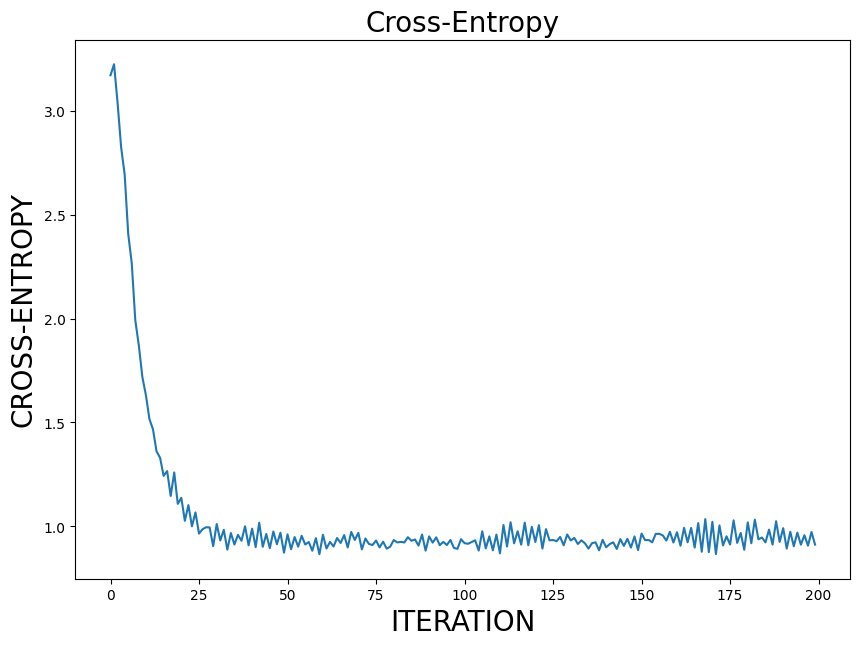

In [18]:
plt.figure(figsize=(10,7))
plt.plot(cross_entropy_values)
plt.title("Cross-Entropy", fontsize = 20)
plt.xlabel("ITERATION", fontsize = 20); plt.ylabel("CROSS-ENTROPY", fontsize = 20)
plt.show()

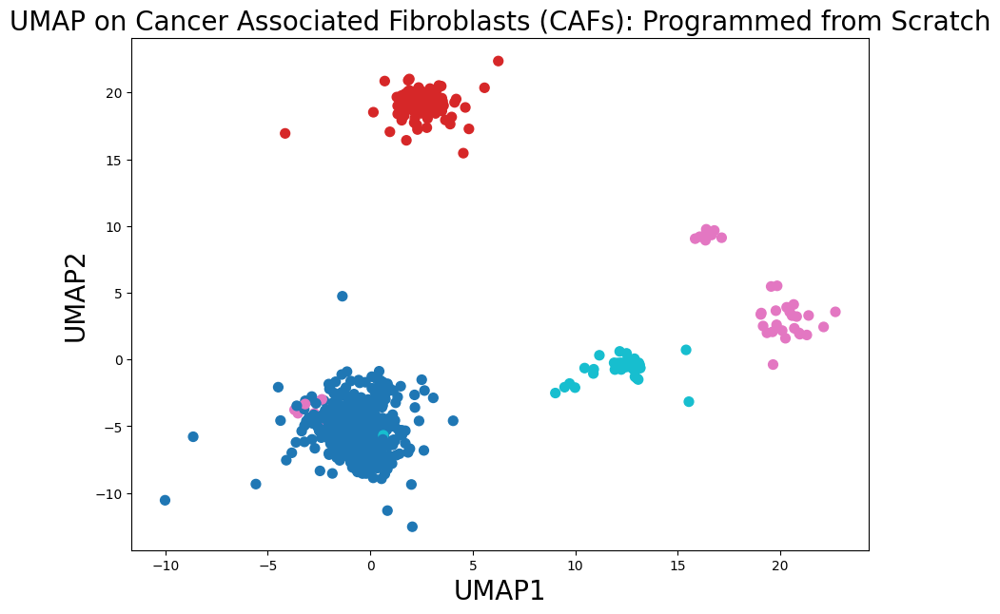

In [19]:
plt.figure(figsize=(10,7))
plt.scatter(y_embeddings[:,0], y_embeddings[:,1], c = y_train.astype(int), cmap = 'tab10', s = 50)
plt.title("UMAP on Cancer Associated Fibroblasts (CAFs): Programmed from Scratch", fontsize = 20)
plt.xlabel("UMAP1", fontsize = 20); plt.ylabel("UMAP2", fontsize = 20)
plt.show()

We can see distinct and tight clusters similar to what it looks like at a UMAP plot. Moreover, these cell populations are super-easy to cluster now with any cluster algorithm, perferably graph-based or density-based, however even K-means or Gaussian Mixture Model (GMM) would do a good job on such a clear dimension reduction plot. Let us animate the clustering process in order to see how the points groups into the clusters:

In [20]:
def create_gif_animation(image_folder, output_path, frame_duration=0.5):
    """
    Create a GIF animation from all images in a specified folder.

    :param image_folder: Path to the folder containing images.
    :param output_path: Path where the GIF should be saved.
    :param frame_duration: Duration of each frame in the animation (in seconds).
    """
    # Retrieve and sort all image file paths
    image_files = sorted(
        [img for img in os.listdir(image_folder) if img.lower().endswith((".png", ".jpg", ".jpeg"))]
    )

    # Create a list to hold the image objects
    frames = []
    for image_file in image_files:
        img_path = os.path.join(image_folder, image_file)
        with Image.open(img_path) as img:
            frames.append(img.copy())  # Use copy to avoid issues with closed images

    # Save frames as a GIF
    frames[0].save(output_path, format='GIF', append_images=frames[1:], save_all=True, duration=frame_duration * 1000, loop=0)

# Usage example
image_folder_path = "UMAP_Plots"
output_gif_path = 'UMAP_Plots/UMAP_animated.gif'
create_gif_animation(image_folder_path, output_gif_path, frame_duration=0.1)

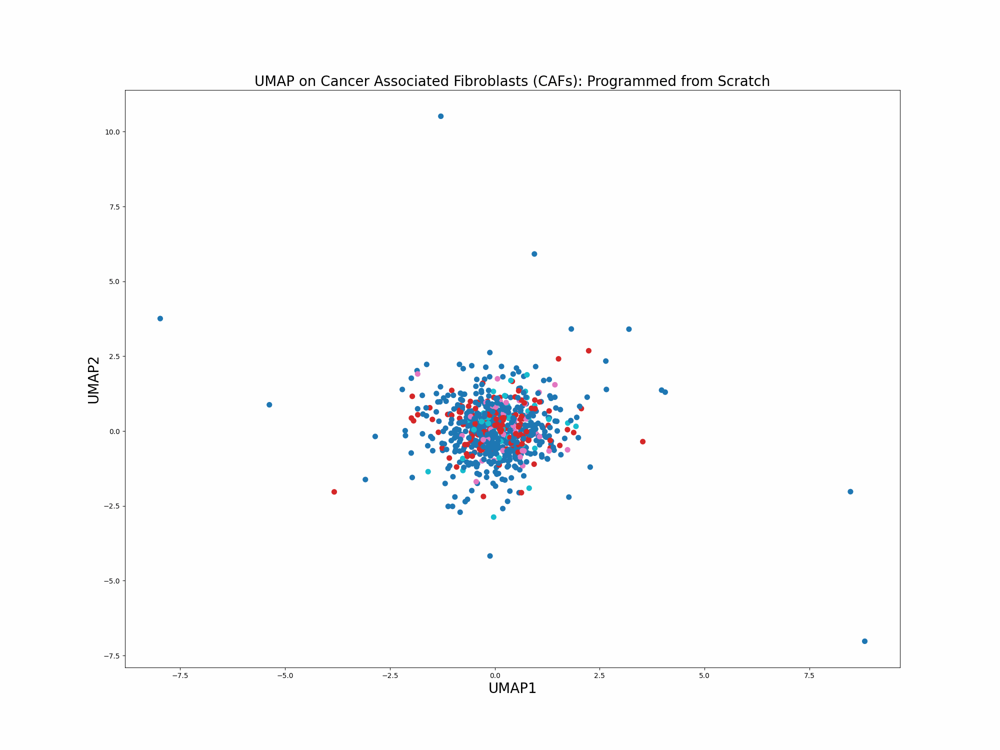

In [23]:
from IPython.display import Image
Image('UMAP_Plots/UMAP_animated.gif', width=2000)

For comparison let us use the original Leland McInnes Python implementation of UMAP with identical hyperparameters in oder to compare it with our "from scratch" UMAP implementation:

UMAP(min_dist=0.25, verbose=True)
Thu Oct 17 11:57:04 2024 Construct fuzzy simplicial set
Thu Oct 17 11:57:05 2024 Finding Nearest Neighbors
Thu Oct 17 11:57:05 2024 Finished Nearest Neighbor Search
Thu Oct 17 11:57:05 2024 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

	completed  0  /  500 epochs
	completed  50  /  500 epochs
	completed  100  /  500 epochs
	completed  150  /  500 epochs
	completed  200  /  500 epochs
	completed  250  /  500 epochs
	completed  300  /  500 epochs
	completed  350  /  500 epochs
	completed  400  /  500 epochs
	completed  450  /  500 epochs
Thu Oct 17 11:57:12 2024 Finished embedding


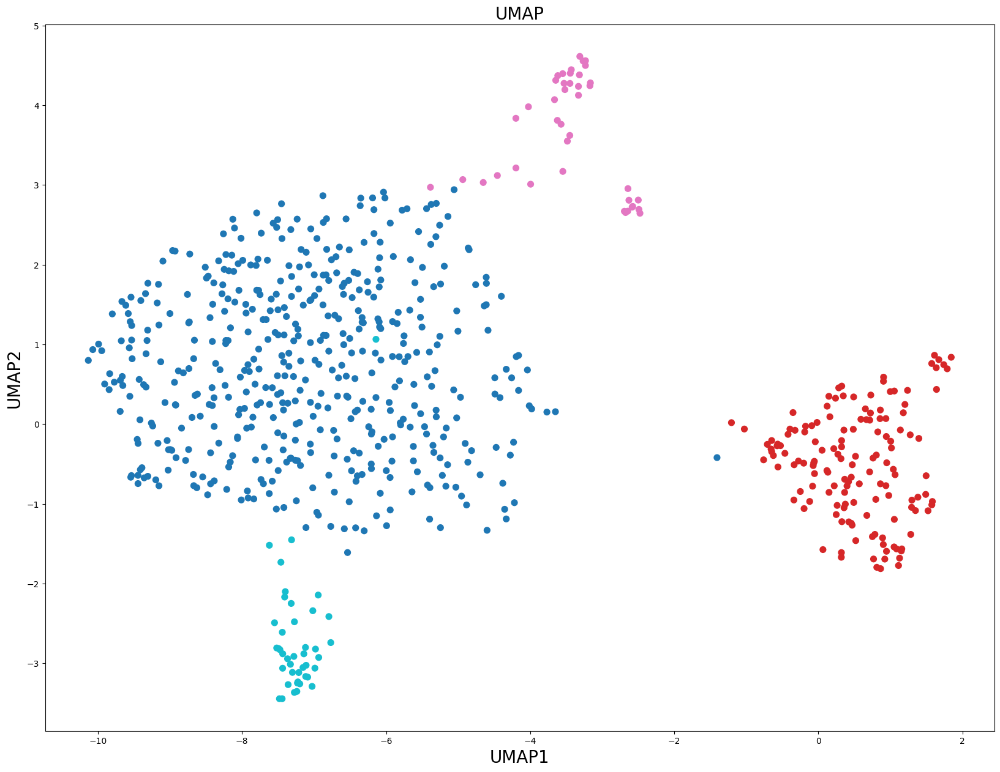

In [24]:
from umap import UMAP

plt.figure(figsize=(20,15))
model = UMAP(n_neighbors=15, min_dist=0.25, n_components=2, verbose=True)
umap = model.fit_transform(X_train)
plt.scatter(umap[:, 0], umap[:, 1], c = y_train.astype(int), cmap = 'tab10', s = 50)
plt.title('UMAP', fontsize = 20)
plt.xlabel("UMAP1", fontsize = 20)
plt.ylabel("UMAP2", fontsize = 20)
plt.show()